# Валидация метрики для оценки разницы между спектрограммами
## Набор данных 2

In [1]:
import sys
sys.path.append('..')

from functools import reduce

from seismicpro.batchflow import Dataset
from seismicpro.src import SeismicBatch, FieldIndex 

from utils import get_cv, draw_modifications_dist

## Процедура получения метрики

**Расстояние между двумя спектрограммами** с равным количеством трасс и отсчетов будем вычислять по следующей процедуре

* Выбрать область из 10% трасс с наименьшим офсетом, ограничить вычисления только в этой области
* Получить спектральную плотность мощности с помощью оконного преобразования Фурье для каждой трассы для обеих спектрограмм
* Для соответствующих значений сдвигов окна по времени и соответсвующих трасс вычислить разницу спектров в разных спектрограммах по формуле
$$
Dist(A_1, A_2) = \sum_{f}\left|{A_{1}[f]-A_{2}[f]}\right|
$$
* Усреднить полученные значения по всем трассам и всем сдвигам окна по времени

![Seismogram difference metrics](Seismogram_difference_metrics.png)

## Заргузка данных

In [2]:
base_path = '/media/data/Data/datasets/Metric_study2/'
      
paths = {
    'lift': '2_human.sgy', 
    'raw': '1_raw.sgy',
    'm_1': '3_sup_bl.sgy',
    'm_2': '4_uns_bl.sgy',
}

field_index = reduce(lambda x, y: x.merge(y), 
                     (FieldIndex(name=name, path=base_path+path, extra_headers=['offset']) for name, path in paths.items()))


batch = (Dataset(field_index, SeismicBatch)
         .next_batch(len(field_index))
         .load(fmt='segy', components=tuple(paths.keys())))

cv = get_cv([batch.__getattr__(c)[0] for c in batch.components])
n_cols = 2

def get_modifications_list(batch, i):
    return [(batch.__getattr__(c)[i], c.upper()) for c in batch.components]

### Количество филдов в данных

In [3]:
len(field_index)

5

### Имеющиеся компоненты

In [4]:
batch.components

('lift', 'raw', 'm_1', 'm_2')

## Расчет метрики отностительно LIFT

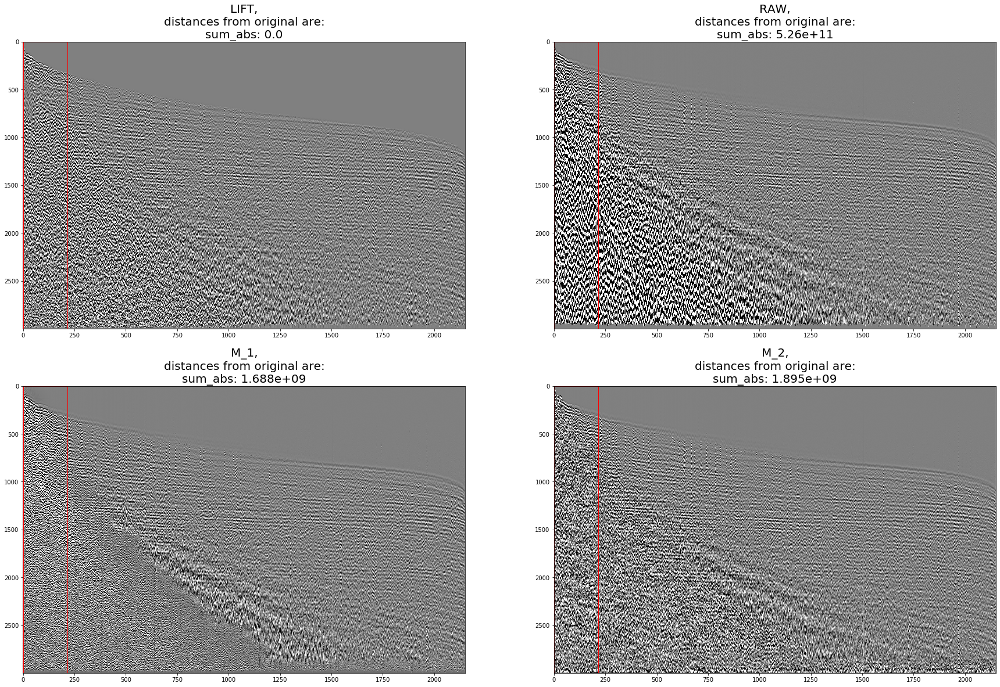

In [5]:
i=0
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

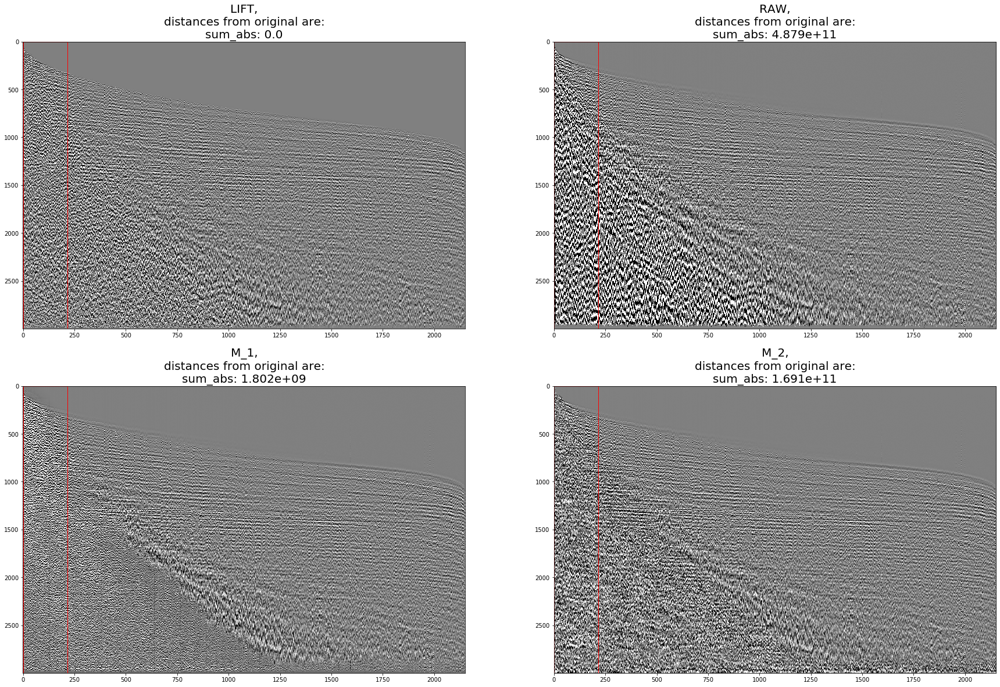

In [6]:
i=1
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

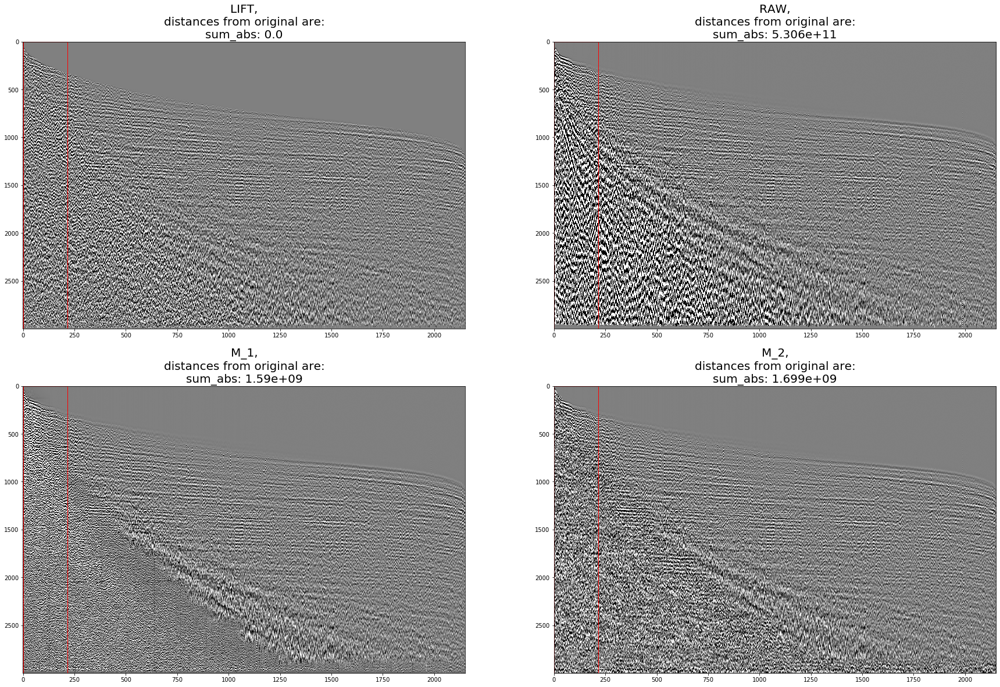

In [7]:
i=2
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

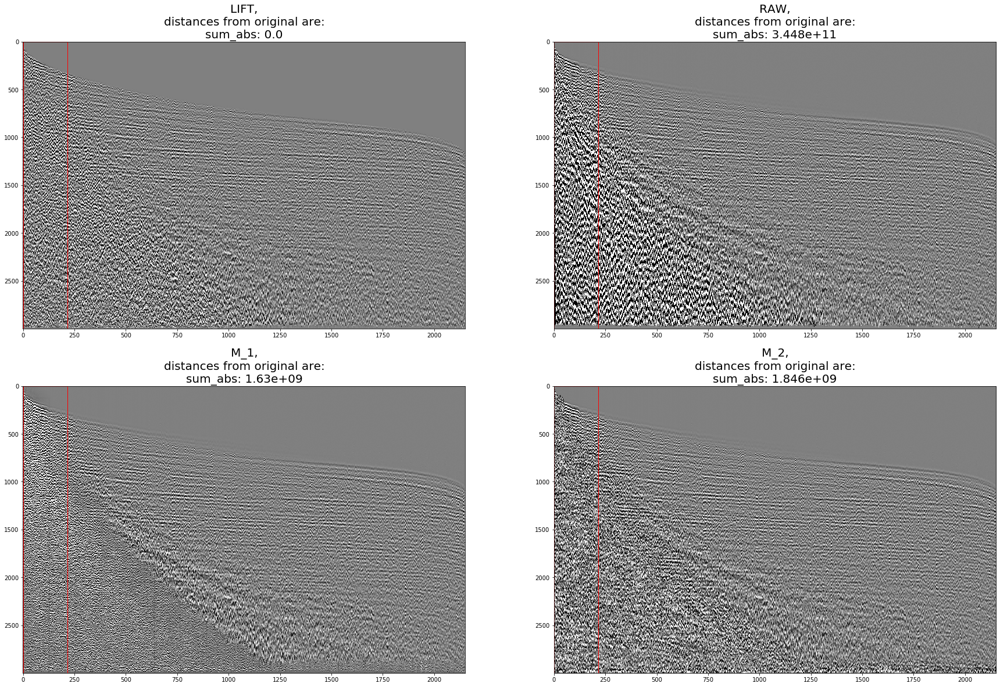

In [8]:
i=3
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

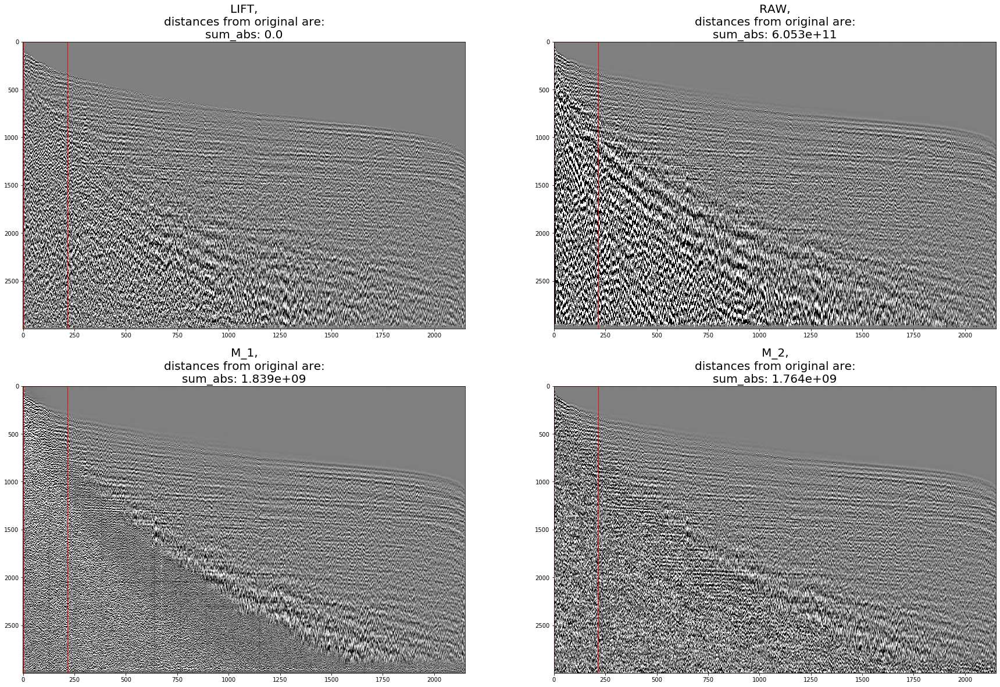

In [9]:
i=4
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')